In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,VotingClassifier,StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,matthews_corrcoef
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import plotly.graph_objs as go
import plotly.subplots as sp
plt.style.use('seaborn-v0_8-whitegrid')


In [20]:
df=pd.read_csv('/content/fetal health.csv')
df

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120,0.000,0.000,0.000,0.000,0.0,0.0,73,0.5,43,2.4,64,62,126,2,0,120,137,121,73,1,2
1,132,0.006,0.000,0.006,0.003,0.0,0.0,17,2.1,0,10.4,130,68,198,6,1,141,136,140,12,0,1
2,133,0.003,0.000,0.008,0.003,0.0,0.0,16,2.1,0,13.4,130,68,198,5,1,141,135,138,13,0,1
3,134,0.003,0.000,0.008,0.003,0.0,0.0,16,2.4,0,23.0,117,53,170,11,0,137,134,137,13,1,1
4,132,0.007,0.000,0.008,0.000,0.0,0.0,16,2.4,0,19.9,117,53,170,9,0,137,136,138,11,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140,0.000,0.000,0.007,0.000,0.0,0.0,79,0.2,25,7.2,40,137,177,4,0,153,150,152,2,0,2
2122,140,0.001,0.000,0.007,0.000,0.0,0.0,78,0.4,22,7.1,66,103,169,6,0,152,148,151,3,1,2
2123,140,0.001,0.000,0.007,0.000,0.0,0.0,79,0.4,20,6.1,67,103,170,5,0,153,148,152,4,1,2
2124,140,0.001,0.000,0.006,0.000,0.0,0.0,78,0.4,27,7.0,66,103,169,6,0,152,147,151,4,1,2


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   int64  
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   int64  
 8   mean_value_of_short_term_variability  

In [22]:
df.isnull().sum()

,0
baseline value,0
accelerations,0
fetal_movement,0
uterine_contractions,0
light_decelerations,0
severe_decelerations,0
prolongued_decelerations,0
abnormal_short_term_variability,0
mean_value_of_short_term_variability,0
percentage_of_time_with_abnormal_long_term_variability,0


In [23]:
bar_fig = go.Bar(
    x=(df['fetal_health']-1).value_counts().index,
    y=(df['fetal_health']-1).value_counts().values,
    marker=dict(color='#66C2A5')
)

# Pie chart for fetal_health value counts
pie_fig = go.Pie(
    labels=(df['fetal_health']-1).value_counts().index,
    values=(df['fetal_health']-1).value_counts().values,
    hole=0.3  # Optional: for a donut-style pie chart
)

# Create subplots with Plotly
fig = sp.make_subplots(
    rows=1, cols=2,
    subplot_titles=("Bar Plot", "Pie Chart"),
    specs=[[{"type": "bar"}, {"type": "pie"}]]
)

# Add the bar plot to the first subplot
fig.add_trace(bar_fig, row=1, col=1)
fig.add_trace(pie_fig, row=1, col=2)

# Update layout for better visualization
fig.update_layout(
    title_text="Fetal Health Distribution",
    showlegend=False,  # Hide legend to avoid redundancy in pie chart
    height=500,
    width=700
)
fig.show()

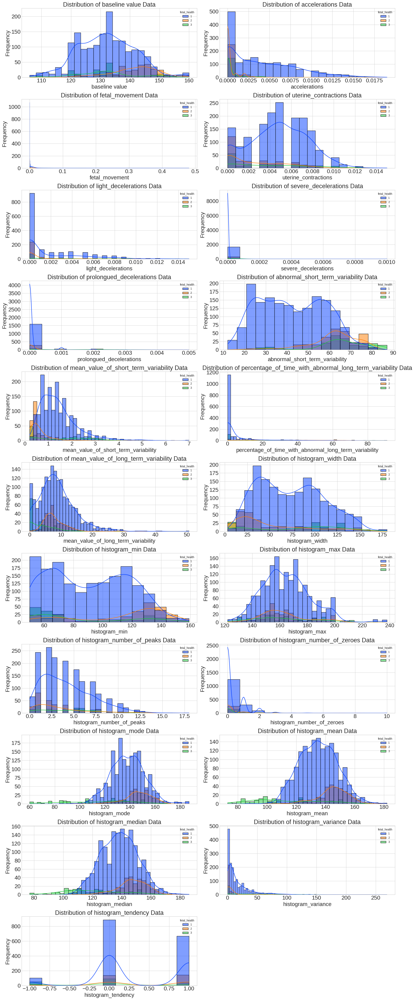

In [26]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

# Set seaborn style
plt.style.use('seaborn-v0_8-whitegrid')

# Drop the target variable from the features
X = df.drop('fetal_health', axis=1)

# Create the figure
plt.figure(figsize=(20, 50))
num_row = 1
for col in X.columns:
    plt.subplot(11, 2, num_row)

    # Set title with larger font size
    plt.title(f"Distribution of {col} Data", fontsize=22)

    # Plot histogram with KDE and hue
    sns.histplot(x=df[col], kde=True, hue=df['fetal_health'], palette='bright')

    # Set x and y axis labels with larger font size
    plt.xlabel(col, fontsize=20)
    plt.ylabel('Frequency', fontsize=20)

    # Set larger font size for ticks
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    #plt.legend(title='fetal_health',title_fontsize='15', fontsize='15')
    # Adjust layout
    plt.tight_layout()

    num_row += 1

# Show the plots

plt.show()

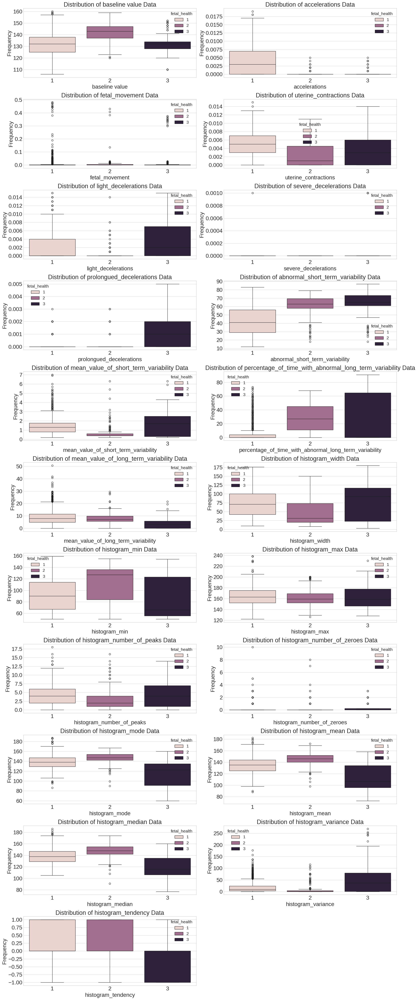

In [27]:
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

# Set seaborn style
plt.style.use('seaborn-v0_8-whitegrid')

# Drop the target variable from the features
X = df.drop('fetal_health', axis=1)
plt.figure(figsize=(20, 50))
num_row = 1

# Loop through each column to create the subplots
for col in X.columns:
    plt.subplot(11, 2, num_row)

    # Set title with larger font size
    plt.title(f"Distribution of {col} Data", fontsize=22)

    # Plot histogram with KDE and hue
    sns.boxplot(y=df[col], x=df['fetal_health'],hue=df['fetal_health'])

    # Set x and y axis labels with larger font size
    plt.xlabel(col, fontsize=20)
    plt.ylabel('Frequency', fontsize=20)

    # Set larger font size for ticks
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(title='fetal_health',title_fontsize='15', fontsize='15')

    # Adjust layout
    plt.tight_layout()

    num_row += 1

# Show the plots

plt.show()

In [29]:
sns.pairplot(df, hue='fetal_health', corner=True, palette='bright', height=5)


plt.show()

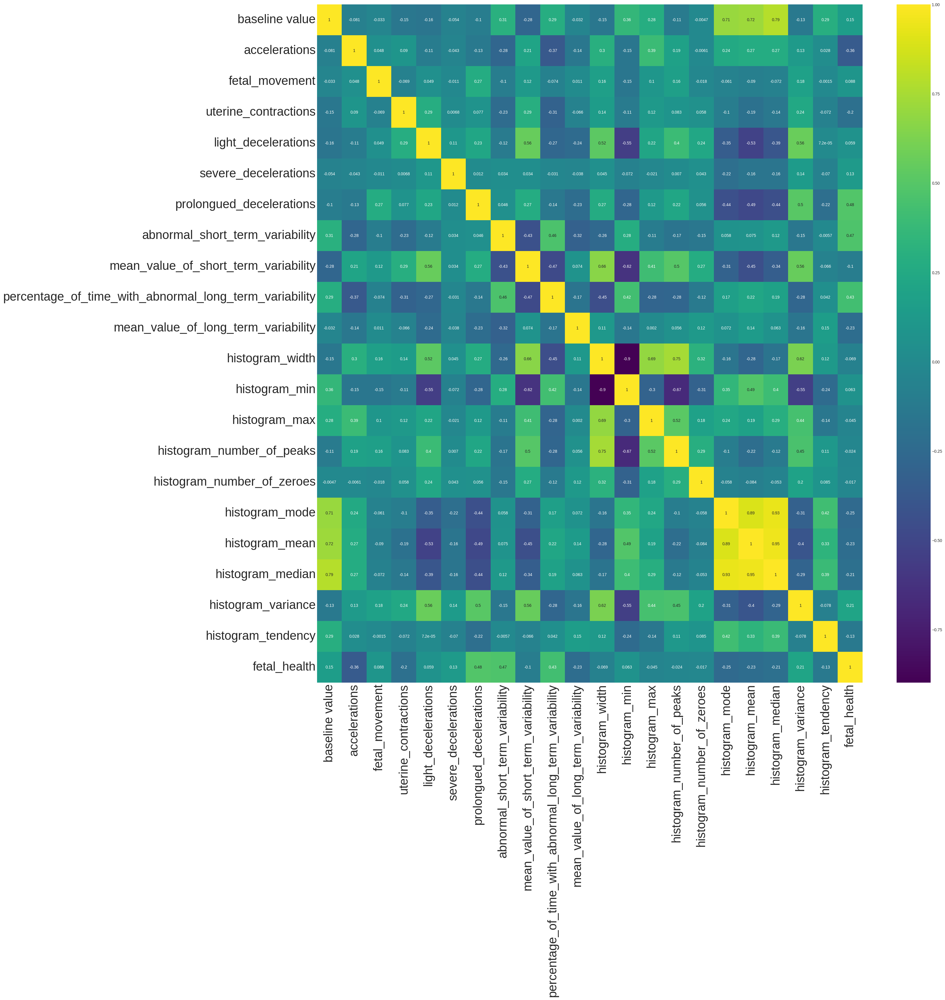

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create the figure
plt.figure(figsize=(30, 30))

# Plot the heatmap
sns.heatmap(df.corr(), annot=True, cmap='viridis')


plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Show the plot
plt.show()

In [31]:
X = df.drop(columns=['fetal_health'])
y = df['fetal_health']
y=y-1
# Scaling the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [32]:
def plot_multi_class_roc(model, X_test, y_test, num_classes=3):
    # Binarize the labels for multi-class ROC calculation
    y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
    y_pred_proba = model.predict_proba(X_test)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # Compute ROC curve and ROC area for each class
    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.figure(figsize=(8, 6))
    colors = cycle(['blue', 'red', 'green'])

    for i, color in zip(range(num_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {i+1} (AUC = {roc_auc[i]:.4f})')

    # Plot the diagonal (random classifier)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Multi-Class ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

In [33]:
log_model = LogisticRegression(random_state=42)
log_model.fit(X_train, y_train)
log_y_pred = log_model.predict(X_test)
log_accuracy = accuracy_score(y_test, log_y_pred)

# Logistic Regression - Classification Report & Confusion Matrix
print("Logistic Regression Classification Report")
print(classification_report(y_test, log_y_pred))
print("Logistic Regression Confusion Matrix")
print(confusion_matrix(y_test, log_y_pred))


# Calculate MCC for the model's predictions
mcc_log = matthews_corrcoef(y_test, log_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_log:.4f}")

Logistic Regression Classification Report
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       333
           1       0.63      0.64      0.64        64
           2       0.73      0.76      0.75        29

    accuracy                           0.88       426
   macro avg       0.77      0.78      0.77       426
weighted avg       0.88      0.88      0.88       426

Logistic Regression Confusion Matrix
[[311  19   3]
 [ 18  41   5]
 [  2   5  22]]
Matthews Correlation Coefficient (MCC): 0.6655


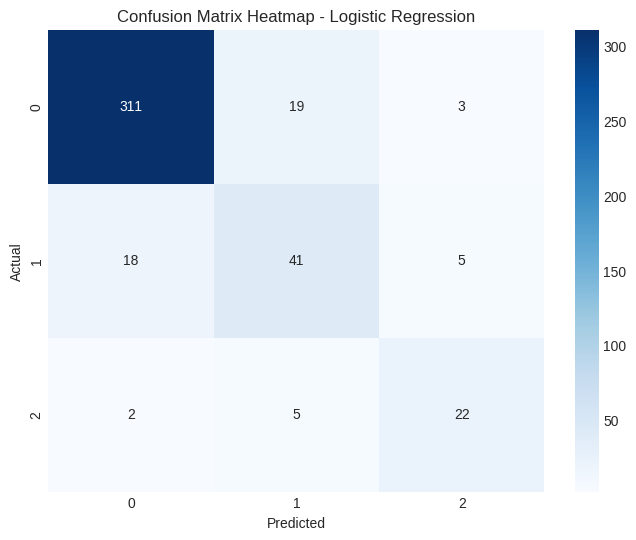

In [34]:
def plot_confusion_matrix_heatmap(y_test, y_pred, model_name):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
    plt.title(f'Confusion Matrix Heatmap - {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()
plot_confusion_matrix_heatmap(y_test, log_y_pred, 'Logistic Regression')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

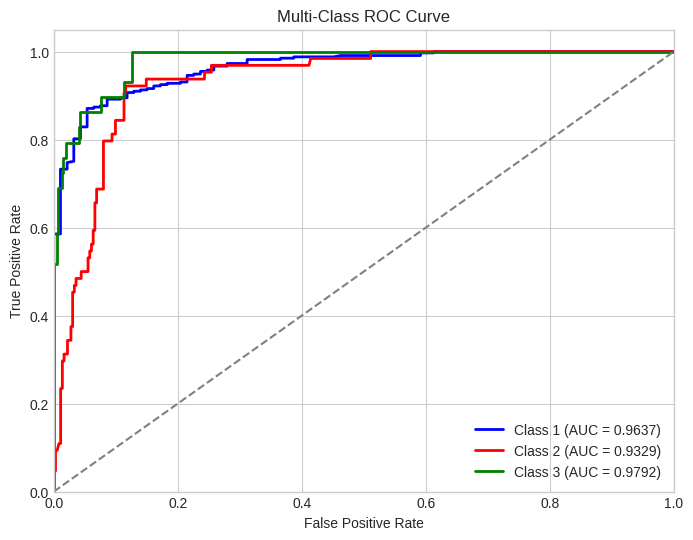

In [35]:
plot_multi_class_roc(log_model, X_test, y_test, num_classes=3)

In [36]:
svm_model = SVC(random_state=42, probability=True)
svm_model.fit(X_train, y_train)
svm_y_pred = svm_model.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_y_pred)
print(svm_accuracy)
print("SVM Classification Report")
print(classification_report(y_test, svm_y_pred))
print("SVM Confusion Matrix")
print(confusion_matrix(y_test, svm_y_pred))
mcc_svm = matthews_corrcoef(y_test,svm_y_pred)
print(f"Matthews Correlation Coefficient (MCC): {mcc_svm:.4f}")

0.903755868544601
SVM Classification Report
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       333
           1       0.70      0.72      0.71        64
           2       0.92      0.76      0.83        29

    accuracy                           0.90       426
   macro avg       0.85      0.81      0.83       426
weighted avg       0.90      0.90      0.90       426

SVM Confusion Matrix
[[317  15   1]
 [ 17  46   1]
 [  2   5  22]]
Matthews Correlation Coefficient (MCC): 0.7302


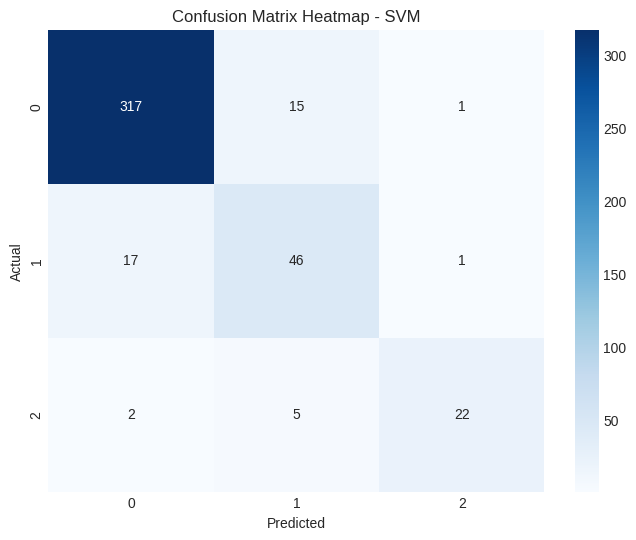

In [37]:
plot_confusion_matrix_heatmap(y_test, svm_y_pred, 'SVM')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

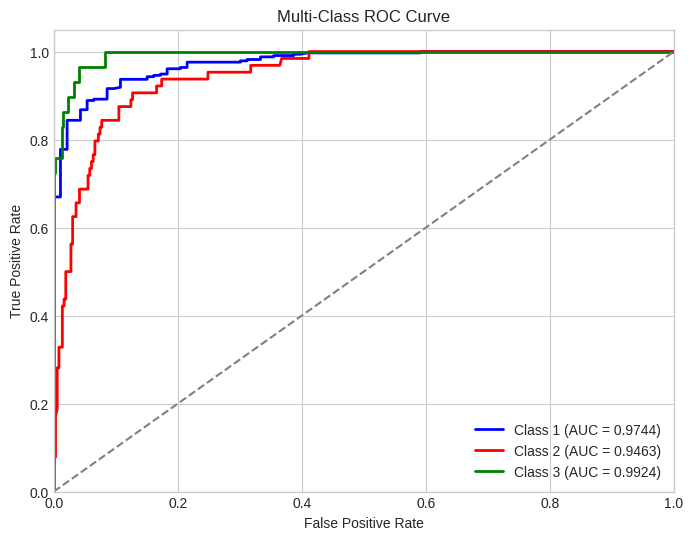

In [38]:
plot_multi_class_roc(svm_model ,X_test, y_test, num_classes=3)

In [39]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
rf_y_pred = rf_model.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_y_pred)

# Random Forest - Classification Report & Confusion Matrix
print("Random Forest Classification Report")
print(classification_report(y_test, rf_y_pred))
print("Random Forest Confusion Matrix")
print(confusion_matrix(y_test, rf_y_pred))

# Calculate MCC for the model's predictions
mcc_rf = matthews_corrcoef(y_test,rf_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_rf:.4f}")

Random Forest Classification Report
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       333
           1       0.88      0.78      0.83        64
           2       0.93      0.93      0.93        29

    accuracy                           0.95       426
   macro avg       0.92      0.90      0.91       426
weighted avg       0.94      0.95      0.94       426

Random Forest Confusion Matrix
[[326   6   1]
 [ 13  50   1]
 [  1   1  27]]
Matthews Correlation Coefficient (MCC): 0.8474


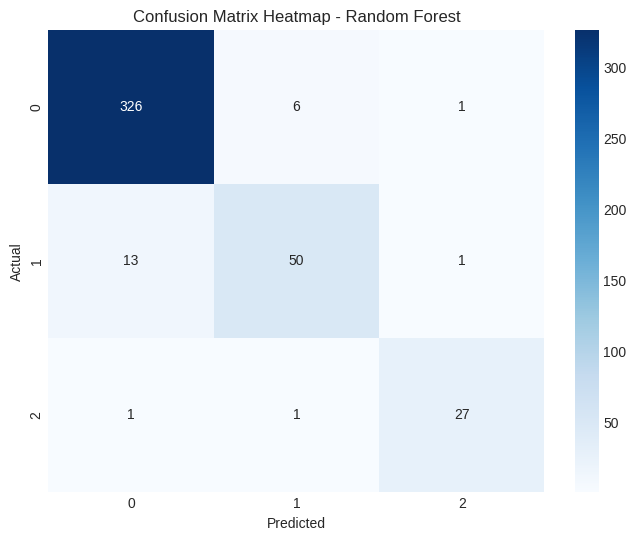

In [40]:
plot_confusion_matrix_heatmap(y_test, rf_y_pred, 'Random Forest')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

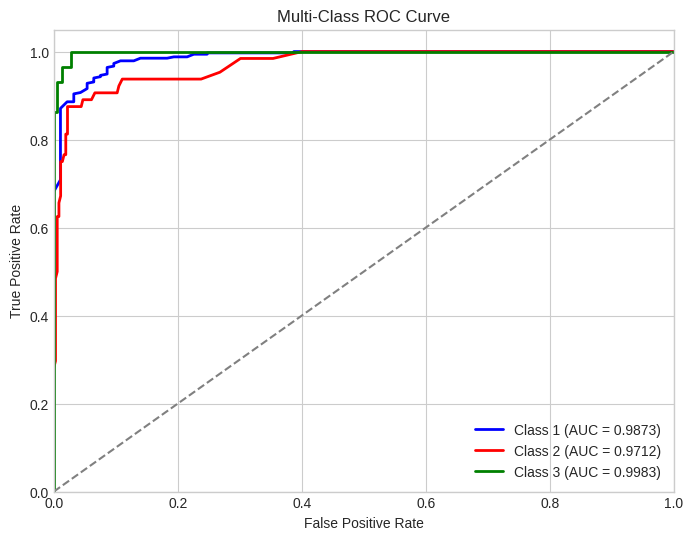

In [41]:
plot_multi_class_roc(rf_model ,X_test, y_test, num_classes=3)

In [42]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
knn_y_pred = knn_model.predict(X_test)
knn_accuracy = accuracy_score(y_test, knn_y_pred)

# K-Nearest Neighbors (KNN) - Classification Report & Confusion Matrix
print("KNN Classification Report")
print(classification_report(y_test, knn_y_pred))
print("KNN Confusion Matrix")
print(confusion_matrix(y_test, knn_y_pred))

# Calculate MCC for the model's predictions
mcc_knn = matthews_corrcoef(y_test,knn_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_knn:.4f}")

KNN Classification Report
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       333
           1       0.81      0.69      0.75        64
           2       0.79      0.76      0.77        29

    accuracy                           0.92       426
   macro avg       0.85      0.81      0.82       426
weighted avg       0.91      0.92      0.91       426

KNN Confusion Matrix
[[324   7   2]
 [ 16  44   4]
 [  4   3  22]]
Matthews Correlation Coefficient (MCC): 0.7575


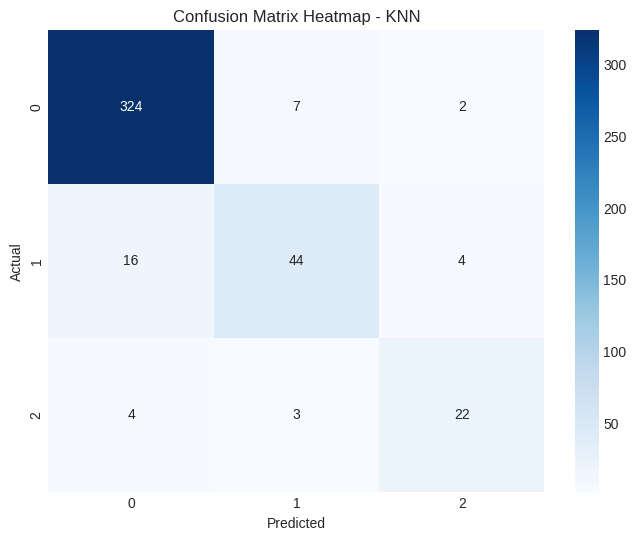

In [43]:
plot_confusion_matrix_heatmap(y_test, knn_y_pred, 'KNN')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

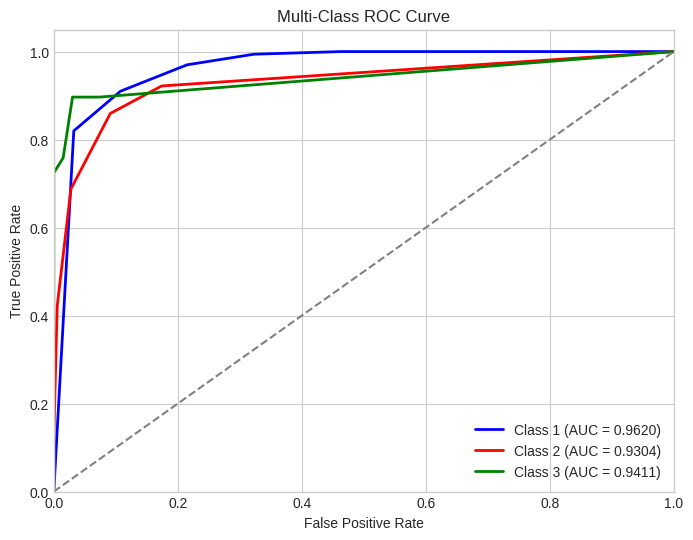

In [44]:
plot_multi_class_roc(knn_model ,X_test, y_test, num_classes=3)

In [45]:
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train, y_train)
xgb_y_pred = xgb_model.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_y_pred)

# XGBoost - Classification Report & Confusion Matrix

print("XGBoost Classification Report")
print(classification_report(y_test, xgb_y_pred))
print("XGBoost Confusion Matrix")
print(confusion_matrix(y_test, xgb_y_pred))

# Calculate MCC for the model's predictions
mcc_XGb = matthews_corrcoef(y_test,xgb_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_XGb:.4f}")

XGBoost Classification Report
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       333
           1       0.89      0.86      0.87        64
           2       0.94      1.00      0.97        29

    accuracy                           0.96       426
   macro avg       0.93      0.95      0.94       426
weighted avg       0.96      0.96      0.96       426

XGBoost Confusion Matrix
[[325   7   1]
 [  8  55   1]
 [  0   0  29]]
Matthews Correlation Coefficient (MCC): 0.8899


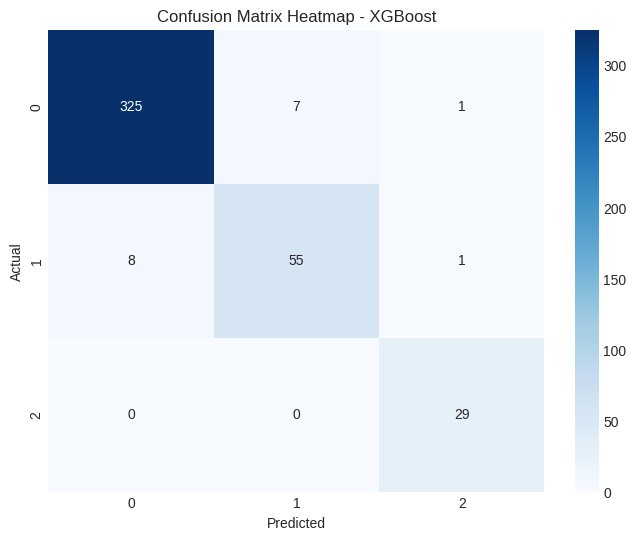

In [46]:
plot_confusion_matrix_heatmap(y_test, xgb_y_pred, 'XGBoost')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

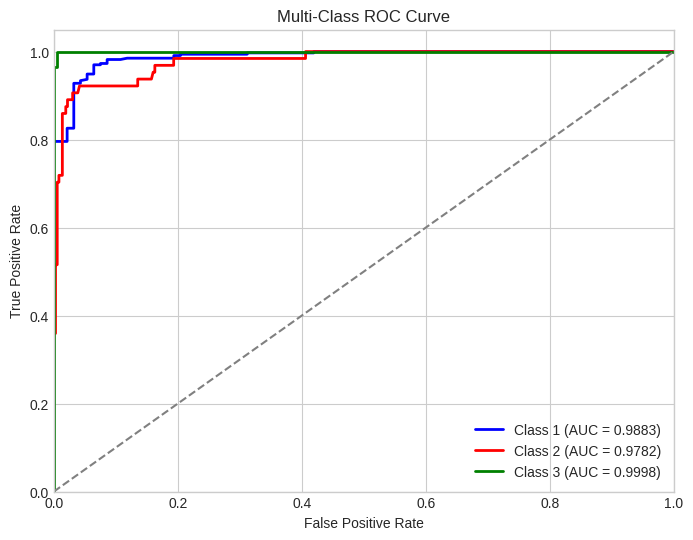

In [47]:
plot_multi_class_roc(xgb_model ,X_test, y_test, num_classes=3)

In [48]:
voting_model = VotingClassifier(
    estimators=[('xgb', xgb_model), ('rf', rf_model)],
    voting='soft'  # soft voting averages the predicted probabilities
)
voting_model.fit(X_train, y_train)

# Predictions
voting_y_pred = voting_model.predict(X_test)

# Accuracy
voting_accuracy = accuracy_score(y_test, voting_y_pred)

# Classification Report & Confusion Matrix for Blending
print("Blending (Voting) Classification Report")
print(classification_report(y_test, voting_y_pred))
print("Blending (Voting) Confusion Matrix")
print(confusion_matrix(y_test, voting_y_pred))
print(f"Blending Accuracy: {voting_accuracy:.4f}")

# Calculate MCC for the model's predictions
mcc_voting = matthews_corrcoef(y_test,voting_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_voting:.4f}")

Blending (Voting) Classification Report
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       333
           1       0.87      0.86      0.87        64
           2       0.93      0.97      0.95        29

    accuracy                           0.96       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.96      0.96      0.96       426

Blending (Voting) Confusion Matrix
[[324   8   1]
 [  8  55   1]
 [  1   0  28]]
Blending Accuracy: 0.9554
Matthews Correlation Coefficient (MCC): 0.8768


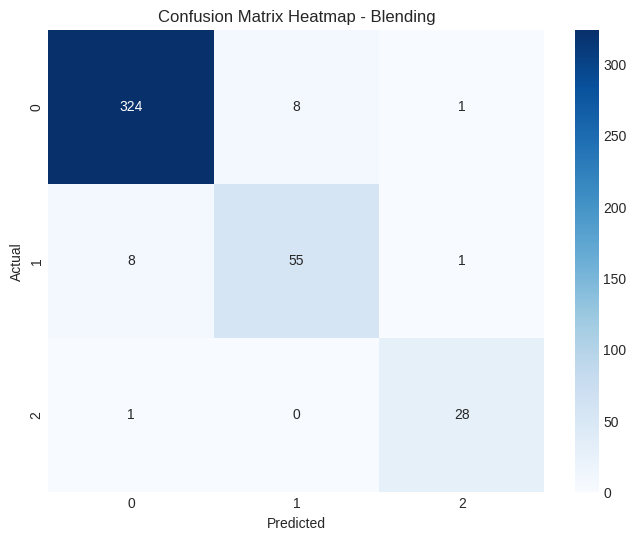

In [49]:
plot_confusion_matrix_heatmap(y_test, voting_y_pred, 'Blending')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

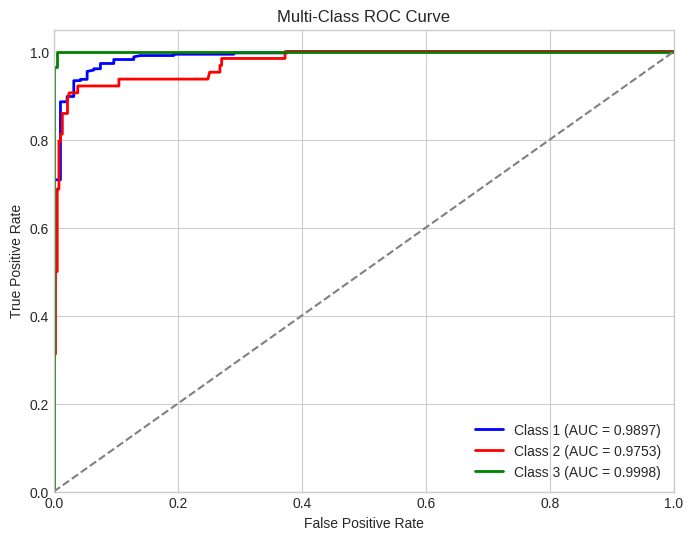

In [50]:
plot_multi_class_roc(voting_model ,X_test, y_test, num_classes=3)

In [51]:
stacking_model = StackingClassifier(
    estimators=[('xgb', xgb_model), ('rf', rf_model)],
    final_estimator=LogisticRegression(),  # Meta-model
    cv=5  # Cross-validation folds in Stacking Classifier
)

# Fit Stacking Model
stacking_model.fit(X_train, y_train)

# Cross-Validation Scores
cv_scores = cross_val_score(stacking_model, X_train, y_train, cv=5, scoring='accuracy')

# Predictions on Test Set
stacking_y_pred = stacking_model.predict(X_test)

# Accuracy
stacking_accuracy = accuracy_score(y_test, stacking_y_pred)
print("Stacking Classification Report")
print(classification_report(y_test, stacking_y_pred))
print("Stacking Confusion Matrix")
print(confusion_matrix(y_test, stacking_y_pred))

# Accuracy of Stacking
print(f"Stacking Accuracy: {stacking_accuracy:.4f}")

# Cross-Validation Results
print(f"Cross-Validation Accuracy Scores: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {cv_scores.mean():.4f}")

# Calculate MCC for the model's predictions
mcc_stacking = matthews_corrcoef(y_test,stacking_y_pred)

# Print MCC
print(f"Matthews Correlation Coefficient (MCC): {mcc_stacking :.4f}")

Stacking Classification Report
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       333
           1       0.87      0.86      0.87        64
           2       0.93      0.97      0.95        29

    accuracy                           0.96       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.96      0.96      0.96       426

Stacking Confusion Matrix
[[324   8   1]
 [  8  55   1]
 [  1   0  28]]
Stacking Accuracy: 0.9554
Cross-Validation Accuracy Scores: [0.94705882 0.93823529 0.93529412 0.95294118 0.95588235]
Mean Cross-Validation Accuracy: 0.9459
Matthews Correlation Coefficient (MCC): 0.8768


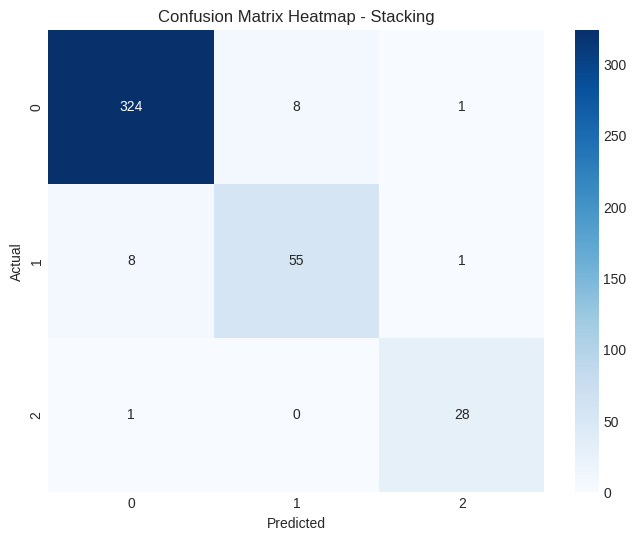

In [52]:
plot_confusion_matrix_heatmap(y_test, stacking_y_pred, 'Stacking')

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

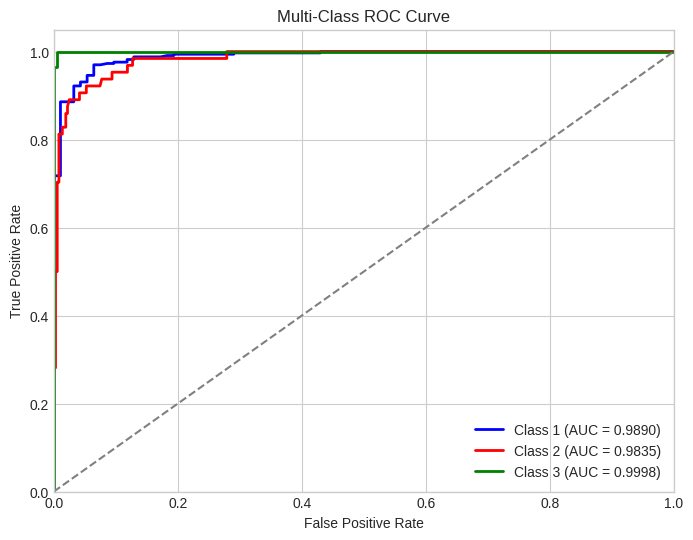

In [53]:
plot_multi_class_roc(stacking_model ,X_test, y_test, num_classes=3)

In [54]:
import plotly.graph_objs as go

# Data for the bar plot
models = ['Logistic Regression', 'SVM', 'Random Forest', 'KNN', 'XGBoost', 'Stacking', 'Blending']
accuracies = [log_accuracy, svm_accuracy, rf_accuracy, knn_accuracy, xgb_accuracy, stacking_accuracy, voting_accuracy]

# Create a bar plot
bar_fig = go.Figure()

# Add bar trace
bar_fig.add_trace(go.Bar(
    x=models,
    y=accuracies,
    marker_color='#66C2A5'
))
bar_fig.update_layout(
    title='Model Comparison - Accuracy',
    xaxis_title='Models',
    yaxis_title='Accuracy',
    yaxis=dict(range=[0.8, 1.0]),  # Set y-axis limits
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    width=800,  # Increase width
    height=800   # Increase height
)

# Show the figure
bar_fig.show()

In [55]:
models = ['Logistic Regression', 'SVM', 'Random Forest', 'KNN', 'XGBoost', 'Stacking', 'Blending']
mcc_values = [mcc_log, mcc_svm, mcc_rf, mcc_knn, mcc_XGb, mcc_stacking, mcc_voting]

# Create a bar plot
mcc_fig = go.Figure()

# Add bar trace
mcc_fig.add_trace(go.Bar(
    x=models,
    y=mcc_values,
    marker_color='#66C2A5'
))
mcc_fig.update_layout(
    title='Model Comparison - MCC',
    xaxis_title='Models',
    yaxis_title='Matthews Correlation Coefficient (MCC)',
    yaxis=dict(range=[0.0, 1.0]),  # Set y-axis limits
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    width=800,  # Increase width
    height=700   # Increase height
)

# Show the figure
mcc_fig.show()

In [56]:
d={'Models':models,'Accuracies':accuracies,'MCC':mcc_values}
Models_comparison=pd.DataFrame(d)


from IPython.display import display, HTML
# Sort the DataFrame by 'Accuracies' and reset the index
Models_comparison_sorted = Models_comparison.sort_values(by='Accuracies', ascending=False).reset_index(drop=True)
# Define the HTML table string with inline CSS styling
html_table = """
<table style="width:60%; margin:auto; border-collapse:collapse; font-family:Georgia, serif; font-size:18px; text-align:center;">
  <thead>
    <tr style="background-color:#4A90E2; color:white; border:2px solid #66C2A5;">
      <th style="padding:12px;">Models</th>
      <th style="padding:12px;">Accuracies</th>
      <th style="padding:12px;">MCC</th>
    </tr>
  </thead>
  <tbody>
"""
# Add table rows dynamically from the DataFrame
for _, row in Models_comparison_sorted.iterrows():
    html_table += f"""
    <tr style="border-bottom:1px solid #ddd;">
      <td style="padding:12px; background-color:#E6F9E6;">{row['Models']}</td>
      <td style="padding:12px; background-color:#F0F4C3;">{row['Accuracies']:.6f}</td>
      <td style="padding:12px; background-color:#E6F9E6;">{row['MCC']:.6f}</td>
    </tr>
    """
# Close the HTML table
html_table += """
  </tbody>
</table>
"""
# Display the HTML table
display(HTML(html_table))

Models,Accuracies,MCC
XGBoost,0.960094,0.889860
Stacking,0.955399,0.876789
Blending,0.955399,0.876789
Random Forest,0.946009,0.847387
KNN,0.915493,0.757509
SVM,0.903756,0.730215
Logistic Regression,0.877934,0.665549
